In [ ]:
from google.colab import drive
drive.mount('/content/drive/')


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
%matplotlib inline
import torch
from torchvision import datasets, models, transforms
import torch.nn as nn
from torch.nn import functional as F
import torch.optim as optim

In [ ]:
normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406 ],
                                 std=[0.229, 0.224, 0.225 ])
 
data_transforms = {
    'train':
        transforms.Compose([
            transforms.Resize((224,224)),
            transforms.RandomAffine(0, shear=10, scale=(0.8,1.2)),
            transforms.RandomHorizontalFlip(),
            transforms.ToTensor(),
            normalize]),
    'validation':
        transforms.Compose([
            transforms.Resize((224,224)),
            transforms.ToTensor(),
            normalize])}
 
image_datasets = {
    'train':
        datasets.ImageFolder('/content/drive/My Drive/train2', data_transforms['train']),  #不能把train這檔案放在其他資料夾 ex: my drive/png/train 不行
    'validation':
        datasets.ImageFolder("/content/drive/My Drive/test2", data_transforms['validation'])}
 
dataloaders = {
    'train':
        torch.utils.data.DataLoader(
            image_datasets['train'],
            batch_size=20,
            shuffle=True,
            num_workers=4),
    'validation':
        torch.utils.data.DataLoader(
            image_datasets['validation'],
            batch_size=20,
            shuffle=False,
            num_workers=4)}



In [ ]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
 
model = models.resnet50(pretrained=True).to(device)
 
for param in model.parameters():
    param.requires_grad = False
 
model.fc = nn.Sequential(
    nn.Linear(2048, 128),
    nn.ReLU(inplace=True),
    nn.Linear(128, 6)).to(device)
 
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.fc.parameters())

Downloading: "https://download.pytorch.org/models/resnet50-19c8e357.pth" to /root/.cache/torch/checkpoints/resnet50-19c8e357.pth
100%|██████████| 102502400/102502400 [00:00<00:00, 116659890.10it/s]


In [ ]:
lossk = []
acck=[]

def train_model(model, criterion, optimizer, num_epochs=8):
    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch+1, num_epochs))
        print('-' * 10)
        
        for phase in ['train', 'validation']:
            if phase == 'train':
                model.train()
            else:
                model.eval()
 
            running_loss = 0.0
            running_corrects = 0
 
            for inputs, labels in dataloaders[phase]:
                inputs = inputs.to(device)
                labels = labels.to(device)
 
                outputs = model(inputs)
                loss = criterion(outputs, labels)
        
                if phase == 'train':
                    optimizer.zero_grad()
                    loss.backward()
                    optimizer.step()
 
                _, preds = torch.max(outputs, 1)
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)
 
            epoch_loss = running_loss / len(image_datasets[phase])
            epoch_acc = running_corrects.double() / len(image_datasets[phase])
            lossk.append(epoch_loss)
            acck.append(epoch_acc)
            print('{} loss: {:.4f}, acc: {:.4f}'.format(phase,
                                                        epoch_loss,
                                                        epoch_acc))
    return model
 
model_trained = train_model(model, criterion, optimizer, num_epochs=30)

Epoch 1/30
----------
train loss: 1.8775, acc: 0.2339
validation loss: 1.5836, acc: 0.3389
Epoch 2/30
----------
train loss: 1.5265, acc: 0.4854
validation loss: 1.3451, acc: 0.5556
Epoch 3/30
----------
train loss: 1.3830, acc: 0.4854
validation loss: 1.1455, acc: 0.6222
Epoch 4/30
----------
train loss: 1.1274, acc: 0.6725
validation loss: 1.0671, acc: 0.6278
Epoch 5/30
----------
train loss: 1.0669, acc: 0.6550
validation loss: 0.9259, acc: 0.7111
Epoch 6/30
----------
train loss: 0.8649, acc: 0.8012
validation loss: 0.8004, acc: 0.7833
Epoch 7/30
----------
train loss: 0.8522, acc: 0.7661
validation loss: 0.7339, acc: 0.8056
Epoch 8/30
----------
train loss: 0.7636, acc: 0.7953
validation loss: 0.6913, acc: 0.7833
Epoch 9/30
----------
train loss: 0.6965, acc: 0.8012
validation loss: 0.6592, acc: 0.8056
Epoch 10/30
----------
train loss: 0.6745, acc: 0.8304
validation loss: 0.6368, acc: 0.8111
Epoch 11/30
----------
train loss: 0.6232, acc: 0.8304
validation loss: 0.5360, acc: 0.86

In [ ]:
ek = [x for x in range(60)]

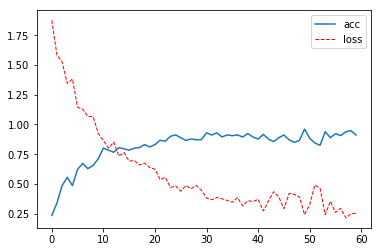

In [ ]:
plt.figure()
plt.plot(ek, acck,label='acc')
plt.plot(ek,lossk, color='red', linewidth=1.0, linestyle='--',label='loss')
plt.legend(loc='upper right')
#plt.yticks([-1.3, -1, 0.8, 0.5, 0.1],[r'$really\ bad$', r'$bad$', r'$normal$', r'$good$', r'$really\ good$'])
plt.show()

In [ ]:
w=np.random.randint(1,31)
print(w,str(w))

8 8


In [ ]:
classes =("櫻花莊","data a live","銀魂","末日","fate","犬夜叉")
print(classes[2])

銀魂


In [ ]:
s=np.random.randint(0,6)
print(s)

0


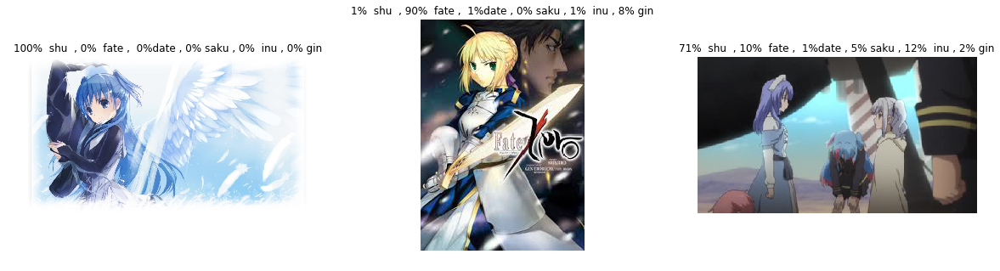

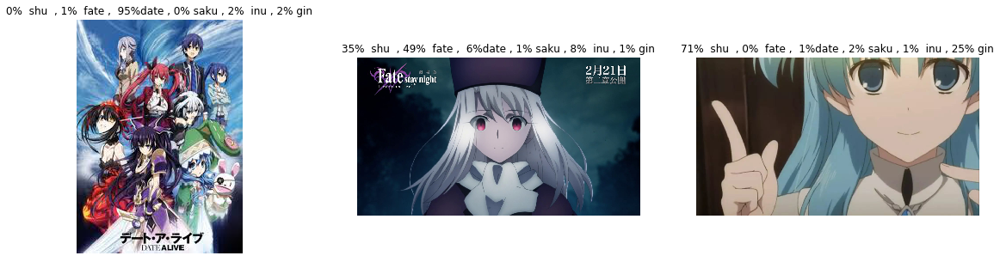

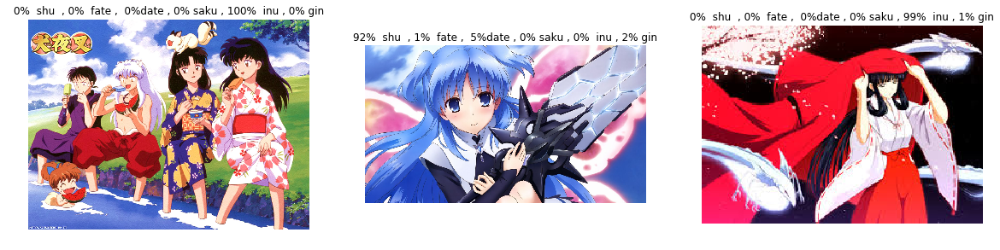

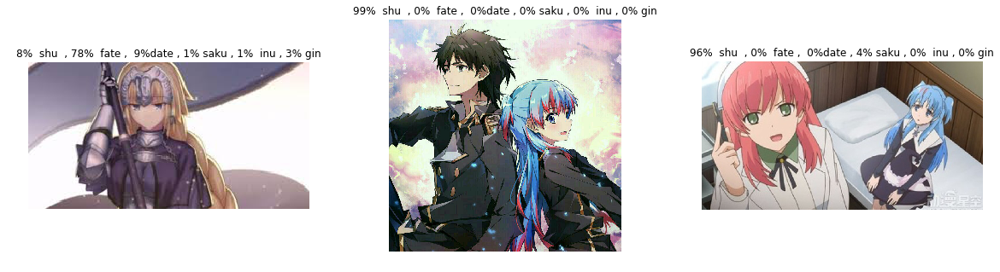

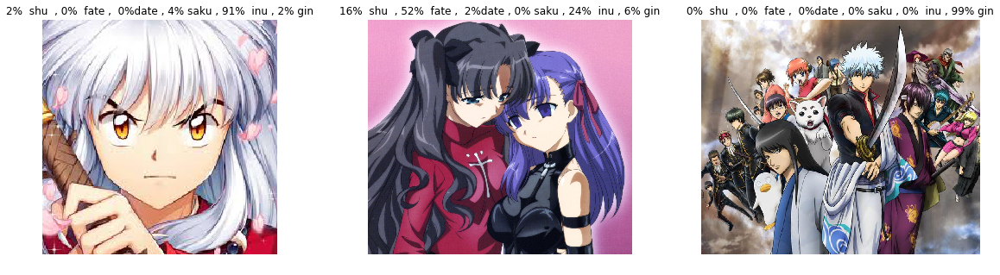

...

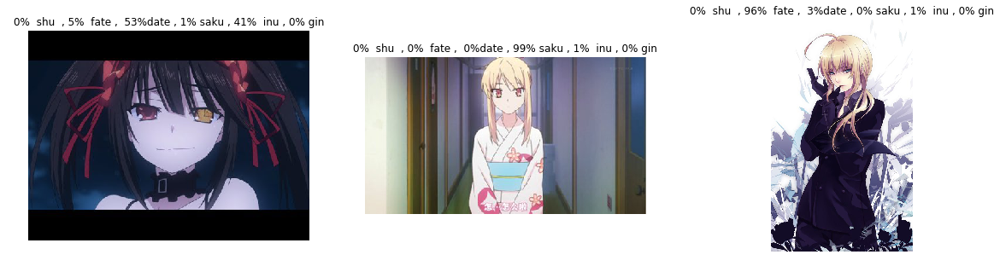

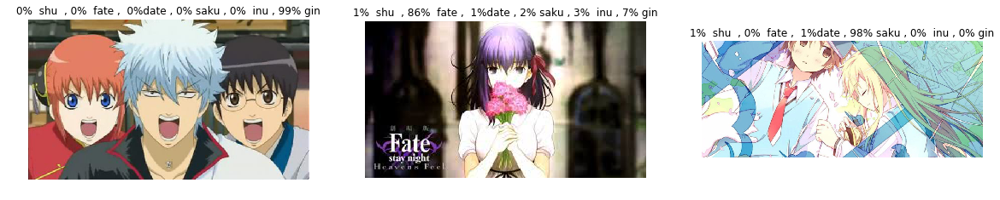

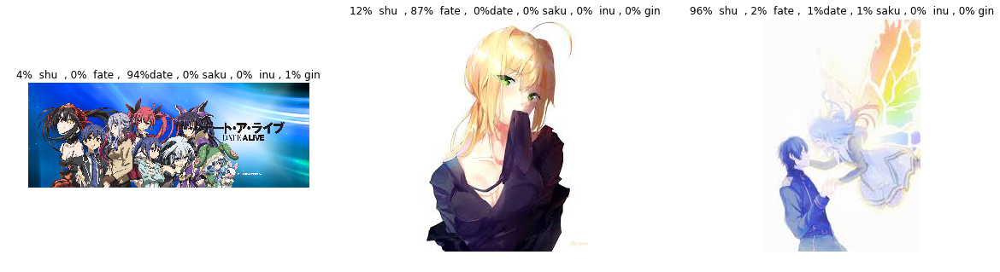

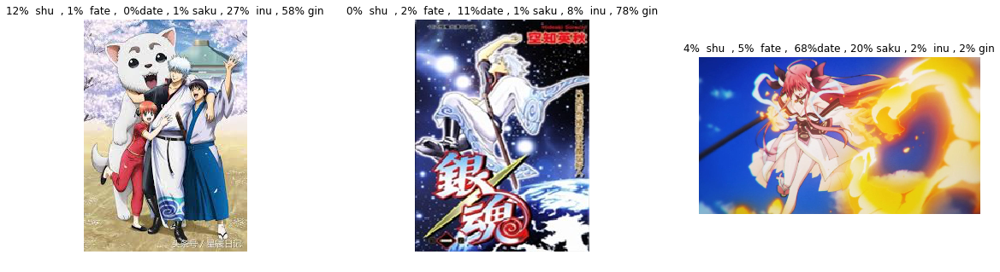

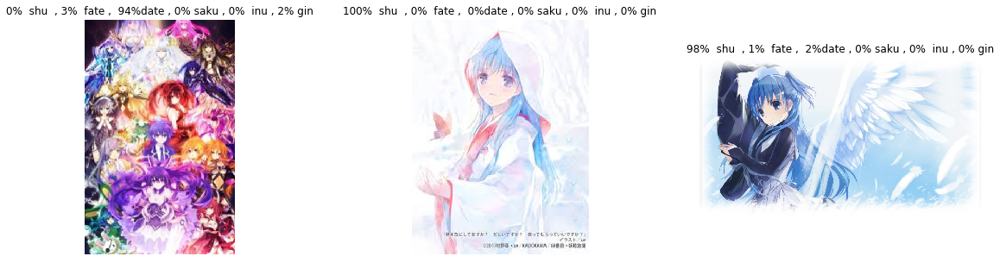

In [ ]:


for kk in range(20):
  w=np.random.randint(1,31)
  s=np.random.randint(0,6)
  a="/content/drive/My Drive/test2/"+classes[s]+"/"+str(w)+".jpg"
  w=np.random.randint(1,31)
  s=np.random.randint(0,6)
  b="/content/drive/My Drive/test2/"+classes[s]+"/"+str(w)+".jpg"
  w=np.random.randint(1,31)
  s=np.random.randint(0,6)
  c="/content/drive/My Drive/test2/"+classes[s]+"/"+str(w)+".jpg"
  validation_img_paths = [a,b,c]
                     
  img_list = [Image.open(img_path) for img_path in validation_img_paths]
  validation_batch = torch.stack([data_transforms['train'](img).to(device)
                                for img in img_list])
 
  pred_logits_tensor = model(validation_batch)
  pred_probs = F.softmax(pred_logits_tensor, dim=1).cpu().data.numpy()
  fig, axs = plt.subplots(1, len(img_list), figsize=(20, 5))
  for i, img in enumerate(img_list):
     ax = axs[i]
     ax.axis('off')
     ax.set_title("{:.0f}%  shu  , {:.0f}%  fate ,  {:.0f}%date , {:.0f}% saku , {:.0f}%  inu , {:.0f}% gin".format(100*pred_probs[i,2],
                                                         100*pred_probs[i,1],100*pred_probs[i,0],100*pred_probs[i,3],100*pred_probs[i,4],100*pred_probs[i,5]))#中文有亂碼
     ax.imshow(img)


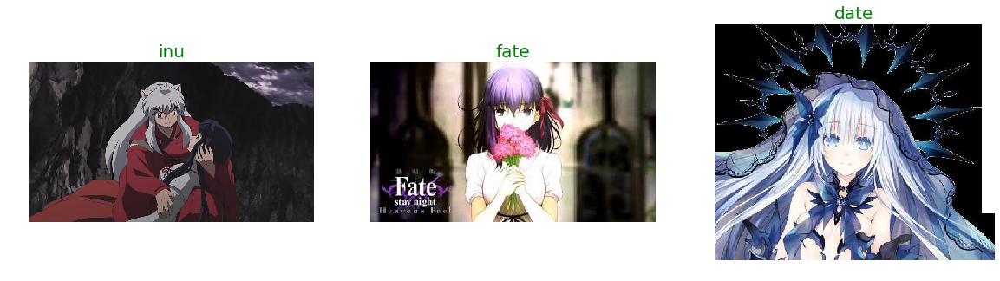

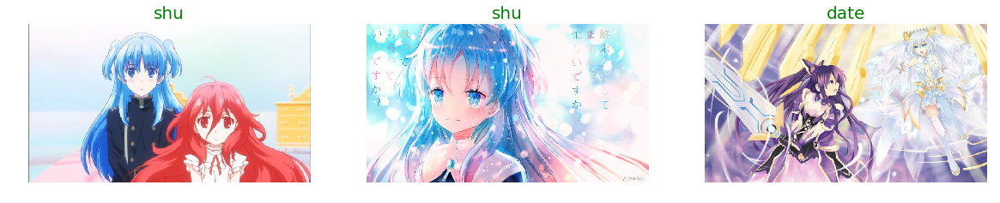

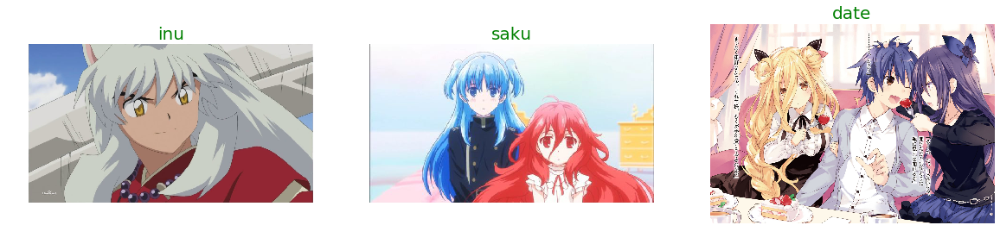

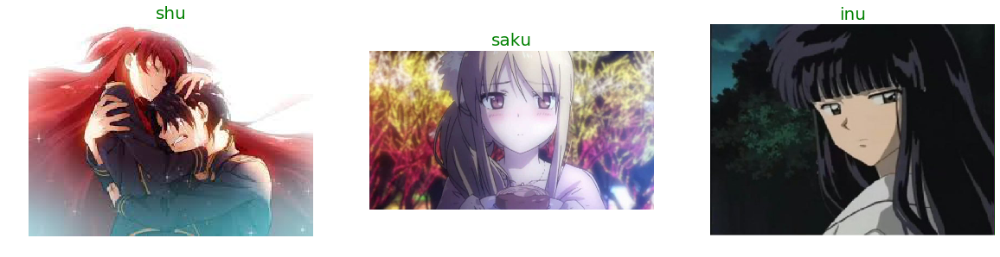

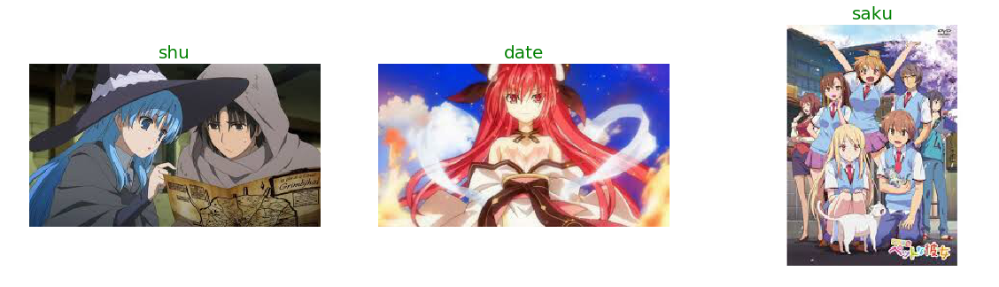

...

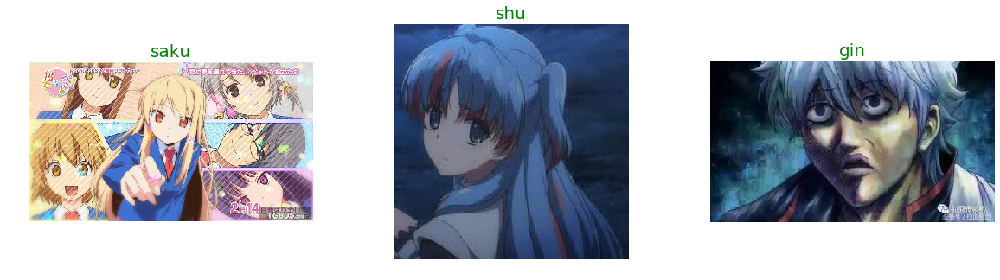

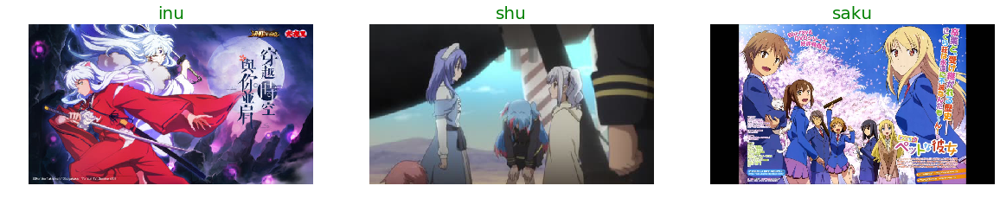

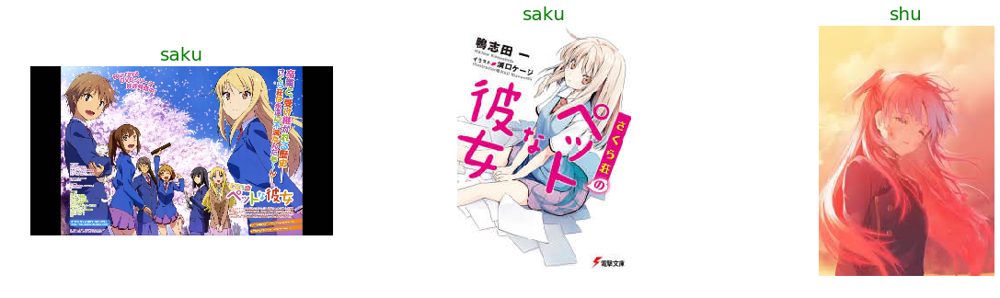

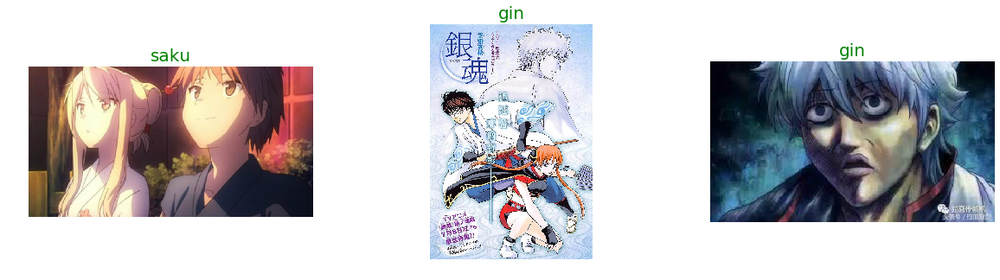

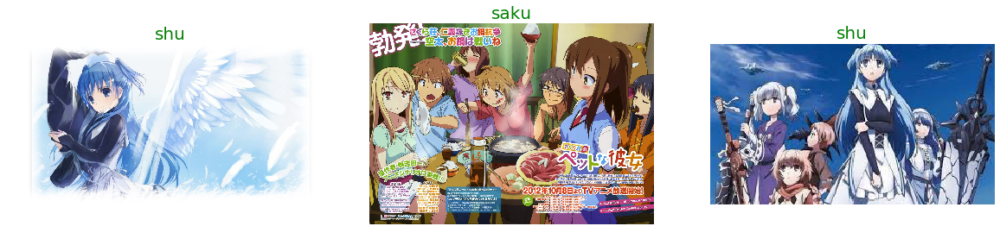

In [ ]:

te=("shu","fate","date","saku","inu","gin")
for kk in range(15):
  w=np.random.randint(1,31)
  s=np.random.randint(0,6)
  a="/content/drive/My Drive/test2/"+classes[s]+"/"+str(w)+".jpg"
  w=np.random.randint(1,31)
  s=np.random.randint(0,6)
  b="/content/drive/My Drive/test2/"+classes[s]+"/"+str(w)+".jpg"
  w=np.random.randint(1,31)
  s=np.random.randint(0,6)
  c="/content/drive/My Drive/test2/"+classes[s]+"/"+str(w)+".jpg"
  validation_img_paths = [a,b,c]
                     
  img_list = [Image.open(img_path) for img_path in validation_img_paths]
  validation_batch = torch.stack([data_transforms['train'](img).to(device)
                                for img in img_list])
 
  pred_logits_tensor = model(validation_batch)
  pred_probs = F.softmax(pred_logits_tensor, dim=1).cpu().data.numpy()
  fig, axs = plt.subplots(1, len(img_list), figsize=(20, 5))
  for i, img in enumerate(img_list):
     ax = axs[i]
     ax.axis('off')
     re=(100*pred_probs[i,2],100*pred_probs[i,1],100*pred_probs[i,0],100*pred_probs[i,3],100*pred_probs[i,4],100*pred_probs[i,5])
     
     mm=re.index(max(re))
     
     ax.set_title(te[mm],fontsize=20,color="green")
     ax.imshow(img)
